In [46]:
import pandas as pd
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from pickle import dump


import matplotlib.style as style
from matplotlib import pyplot as plt
style.use('fivethirtyeight')
rc={'font.family': ['avenir'],
    'axes.edgecolor': '0',
    'axes.spines.right': False,
    'axes.spines.top': False,
    'figure.titleweight':'bold',
    'axes.labelsize':15,
    'axes.labelcolor': '0',
    'axes.labelpad':10,
    'axes.titlesize': 20,
    'axes.titlepad':15,
    'font.family': ['Avenir'],
    'axes.facecolor':'#f2f2f2', 
    'figure.facecolor':'white',
    'ytick.labelsize': 15,
    'xtick.labelsize': 15,
    'ytick.major.pad': 0,
    'xtick.major.pad': 5,
    'ytick.left': True,
    'xtick.bottom': True,
    'xtick.minor.width': 100,
    'xtick.color':'0'}

sns.set(font_scale=1, rc=rc)

In [47]:
songList = pd.read_csv('songlist3.csv',index_col=0)

In [48]:
moods = ['happy','sad','energetic','calm']
for x in moods:
    print(x,': ',len(songList[songList['p_mood']==x]))

happy :  1474
sad :  1885
energetic :  1330
calm :  1565


In [49]:
a = list(songList.columns)
a.remove('analysis_url')
a.remove('track_href')
a.remove('type')
a.remove('uri')
a.remove('id')
print(a)
songList[a]

['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'p_creator', 'p_mood', 'p_name', 'speechiness', 'tempo', 'time_signature', 'valence']


,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,p_creator,p_mood,p_name,speechiness,tempo,time_signature,valence
0,0.00496,0.733,236093.0,0.899,0.000047,0.0,0.3720,-4.237,1.0,Spotify,energetic,Working Out Together: HAIM,0.1430,127.086,4.0,0.760
1,0.01080,0.657,212107.0,0.695,0.000000,2.0,0.0822,-4.493,1.0,Spotify,energetic,Working Out Together: HAIM,0.0321,65.997,4.0,0.683
2,0.03030,0.796,319373.0,0.867,0.000003,10.0,0.1340,-9.543,1.0,Spotify,energetic,Working Out Together: HAIM,0.0309,120.682,4.0,0.971
3,0.18400,0.731,236920.0,0.738,0.000000,9.0,0.2140,-8.125,0.0,Spotify,energetic,Working Out Together: HAIM,0.0377,117.656,4.0,0.958
4,0.33100,0.942,296147.0,0.641,0.179000,7.0,0.0280,-10.150,1.0,Spotify,energetic,Working Out Together: HAIM,0.0333,114.443,4.0,0.966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6249,0.20800,0.771,219664.0,0.761,0.000000,1.0,0.0910,-4.727,0.0,bella renas,sad,Sad boys Sad Rap,0.0470,131.010,4.0,0.277
6250,0.85300,0.794,342040.0,0.320,0.134000,1.0,0.1120,-12.920,0.0,bella renas,sad,Sad boys Sad Rap,0.1730,174.088,4.0,0.241
6251,0.01210,0.675,155693.0,0.574,0.000011,6.0,0.1080,-8.066,1.0,bella renas,sad,Sad boys Sad Rap,0.0559,135.037,4.0,0.482
6252,0.02630,0.675,185886.0,0.630,0.000000,4.0,0.2840,-8.052,1.0,bella renas,sad,Sad boys Sad Rap,0.0720,77.492,4.0,0.223


In [50]:
group_by_mood = songList.groupby(by=['p_mood'])
group_by_mood.count()

,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,p_creator,p_name,speechiness,tempo,time_signature,track_href,type,uri,valence
p_mood,,,,,,,,,,,,,,,,,,,,
calm,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565,1565
energetic,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330,1330
happy,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474,1474
sad,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885,1885


In [51]:
group_by_mood = songList.groupby(by=['p_mood'])
group_by_mood.mean()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
p_mood,,,,,,,,,,,,,
calm,0.540459,0.619488,185836.604473,0.415670,0.375267,5.468371,0.151878,-10.742767,0.645367,0.086323,113.658117,3.899681,0.364414
energetic,0.090727,0.701918,194593.669925,0.764268,0.075964,5.318797,0.199658,-5.284962,0.578195,0.127232,126.898002,3.973684,0.468186
happy,0.164963,0.639421,205454.449796,0.725486,0.047851,5.179104,0.181635,-6.205636,0.753053,0.065623,119.462349,3.976934,0.595951
sad,0.538587,0.575142,214777.107692,0.408366,0.065414,5.109814,0.146002,-9.615972,0.667374,0.082236,115.785468,3.883289,0.316277


In [52]:
songList.groupby(by=['p_mood']).corr()

acousticness  danceability  duration_ms    energy  \
p_mood                                                                          
calm      acousticness          1.000000     -0.127785    -0.280603 -0.694486   
          danceability         -0.127785      1.000000    -0.203189  0.002185   
          duration_ms          -0.280603     -0.203189     1.000000  0.359800   
          energy               -0.694486      0.002185     0.359800  1.000000   
          instrumentalness      0.280833      0.124116    -0.339326 -0.346075   
          key                   0.002175      0.042100    -0.009670  0.024084   
          liveness             -0.117376     -0.031046     0.034204  0.115827   
          loudness             -0.560993      0.046152     0.301401  0.737680   
          mode                  0.061072     -0.126976     0.098543 -0.021311   
          speechiness           0.062653      0.203246    -0.268514 -0.103523   
          tempo                -0.098917     -0.160260     0.111260  0.115375   
          time_signature       -0.153788      0.139199     0.068618  0.151640   
          valence              -0.185381      0.345219    -0.210599  0.220107   
energetic acousticness          1.000000      0.027395     0.024153 -0.262691   
          danceability          0.027395      1.000000    -0.087255 -0.396140   
          duration_ms           0.024153     -0.087255     1.000000  0.015105   
          energy               -0.262691     -0.396140     0.015105  1.000000   
          instrumentalness     -0.178859     -0.154841     0.011868  0.343585   
          key                   0.002300      0.033465    -0.050002 -0.027200   
          liveness             -0.075684     -0.112951     0.011884  0.184516   
          loudness             -0.118519     -0.249761    -0.002287  0.641924   
          mode                 -0.009675      0.029406     0.012249 -0.063243   
          speechiness          -0.025640      0.246416    -0.026934 -0.167202   
          tempo                -0.180637     -0.149535     0.020070  0.133341   
          time_signature       -0.024921      0.169937    -0.007517  0.072831   
          valence               0.138100      0.277344    -0.049781 -0.023704   
happy     acousticness          1.000000      0.016613    -0.066773 -0.433417   
          danceability          0.016613      1.000000    -0.108753 -0.158795   
          duration_ms          -0.066773     -0.108753     1.000000 -0.023940   
          energy               -0.433417     -0.158795    -0.023940  1.000000   
          instrumentalness     -0.017143     -0.020990     0.183142  0.086316   
          key                   0.049148      0.061367    -0.059716 -0.032448   
          liveness             -0.023087     -0.089642    -0.016958  0.142886   
          loudness             -0.334826     -0.013493    -0.146947  0.595038   
          mode                  0.054453     -0.085442     0.057872 -0.031337   
          speechiness           0.025777      0.050889    -0.102201 -0.002374   
          tempo                -0.057512     -0.221515     0.008021  0.109821   
          time_signature       -0.039610      0.129664    -0.005357  0.028148   
          valence               0.029977      0.345183    -0.127226  0.134844   
sad       acousticness          1.000000     -0.292760    -0.029111 -0.762032   
          danceability         -0.292760      1.000000    -0.256701  0.237850   
          duration_ms          -0.029111     -0.256701     1.000000 -0.008910   
          energy               -0.762032      0.237850    -0.008910  1.000000   
          instrumentalness      0.274842     -0.164361     0.052137 -0.343773   
          key                  -0.027532      0.078226    -0.053624  0.043130   
          liveness             -0.099087      0.061382    -0.018862  0.132077   
          loudness             -0.590834      0.220304     0.002806  0.772021   
          mode                  0.098797     -0.149558     

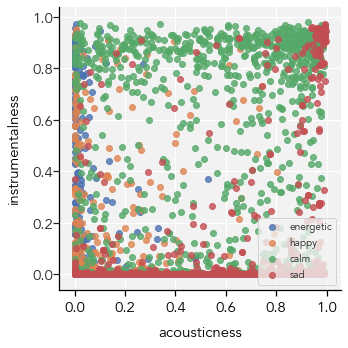

In [53]:
# library & dataset
import seaborn as sns
from matplotlib import pyplot as plt
# Use the 'hue' argument to provide a factor variable
sns.lmplot( x="acousticness", y="instrumentalness", data=songList, fit_reg=False, hue='p_mood', legend=False)
 
# Move the legend to an empty part of the plot
plt.legend(loc='lower right',prop={"size":10})
 

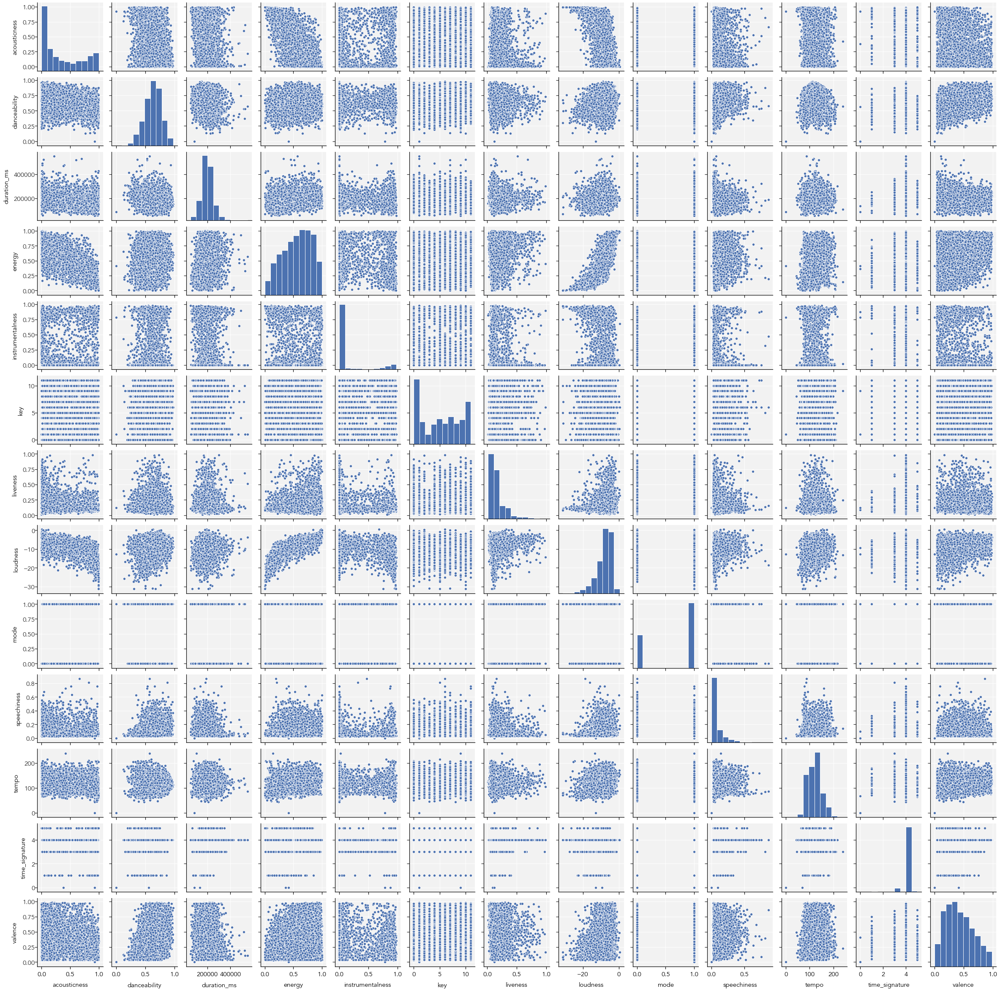

In [54]:
sns.pairplot(songList.loc[:,songList.dtypes == 'float64'])

Index(['acousticness', 'analysis_url', 'danceability', 'duration_ms', 'energy',
       'id', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'p_creator', 'p_mood', 'p_name', 'speechiness', 'tempo',
       'time_signature', 'track_href', 'type', 'uri', 'valence'],
      dtype='object')
0       False
1       False
2       False
3       False
4       False
        ...  
6249    False
6250    False
6251    False
6252    False
6253    False
Name: p_mood, Length: 6254, dtype: bool


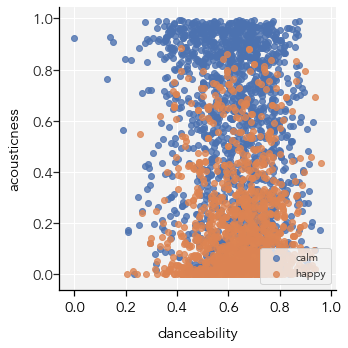

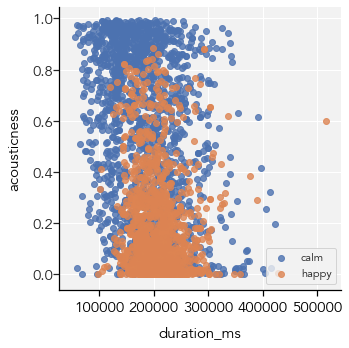

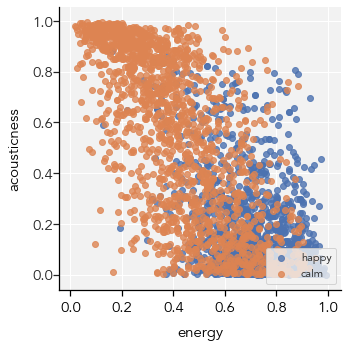

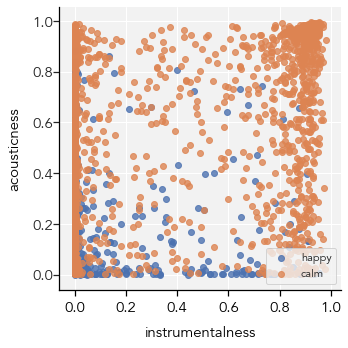

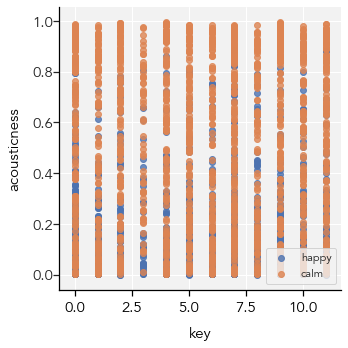

...

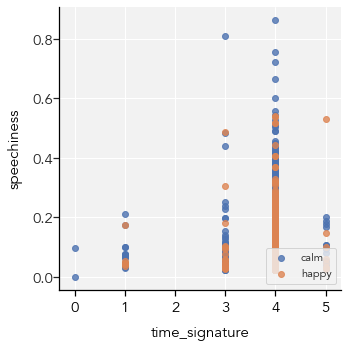

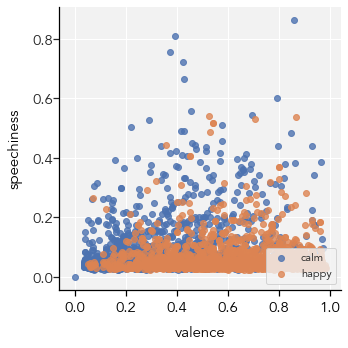

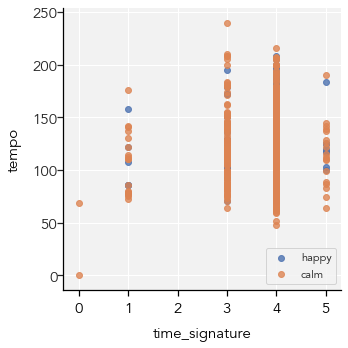

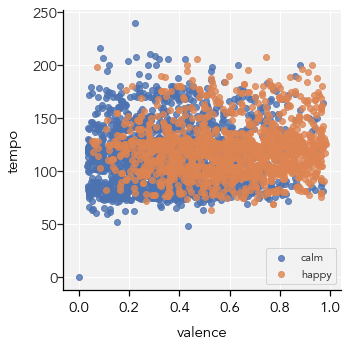

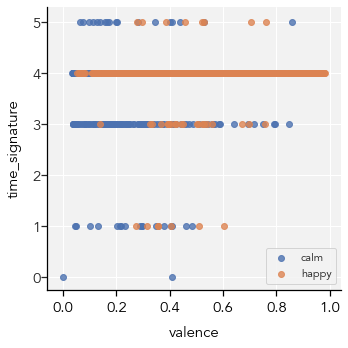

In [55]:
a = songList.dtypes == 'float64'
print(a.index)
desiredMoods = ['calm','happy']
correctMood = songList.p_mood.isin(desiredMoods)
print(correctMood)
for y in range(len(a)):
    for x in range(y+1,len(a)):
        if(a[x] and a[y]):
            try:
                g = sns.lmplot( x=a.index[x], y=a.index[y], data=songList[correctMood].sample(frac=1), fit_reg=False, hue='p_mood', legend=False)
                plt.legend(loc='lower right')
                plt.show(g)
            except:
                print("didnt work")


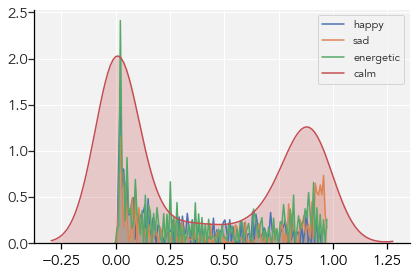

In [56]:
moods = ['happy','sad','energetic','calm']
for mood in moods:
    sns.kdeplot(songList[songList['p_mood']==mood]['instrumentalness'], shade=True,label=mood)

Index(['acousticness', 'analysis_url', 'danceability', 'duration_ms', 'energy',
       'id', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'p_creator', 'p_mood', 'p_name', 'speechiness', 'tempo',
       'time_signature', 'track_href', 'type', 'uri', 'valence'],
      dtype='object')
acousticness


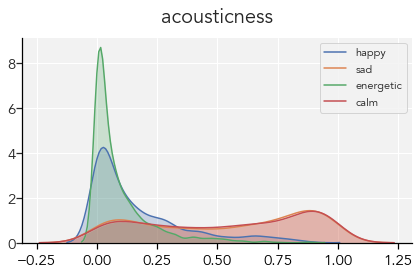

danceability


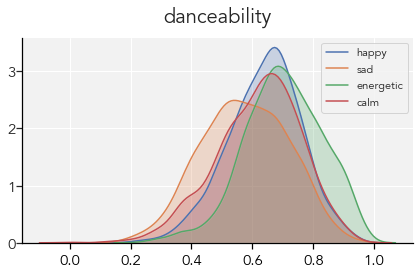

duration_ms


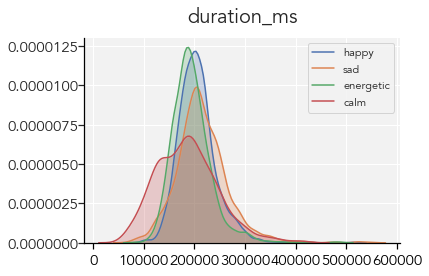

energy


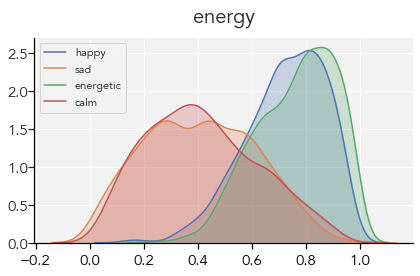

instrumentalness


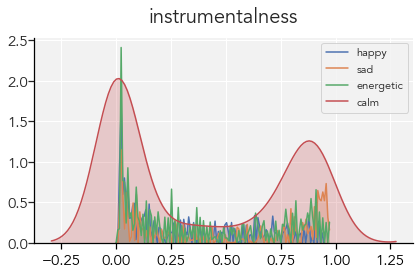

key


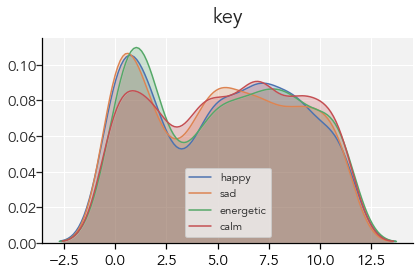

liveness


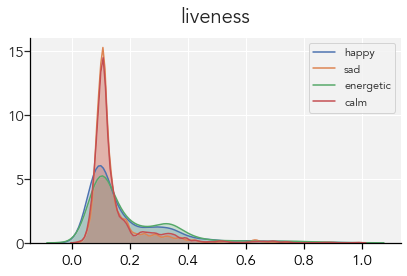

loudness


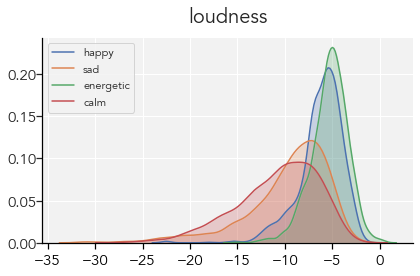

mode
didnt work
speechiness


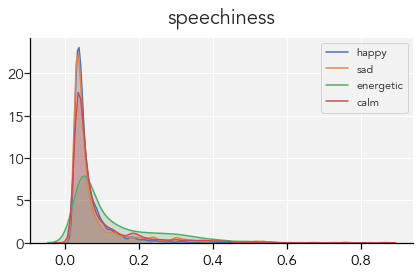

tempo


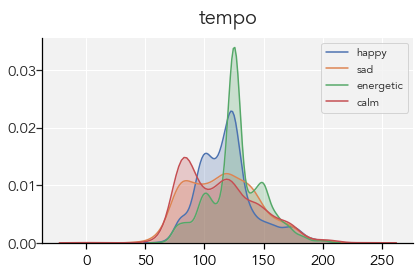

time_signature
didnt work
valence


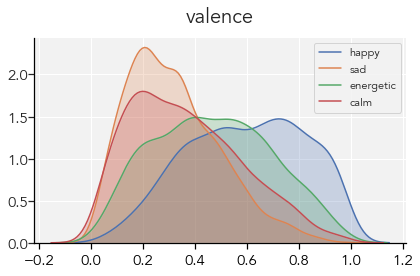

In [57]:
a = songList.dtypes == 'float64'
print(a.index)
for x in range(len(a)):
    if(a[x]):
        try:
            print(a.index[x])
            for mood in moods:
                g = sns.kdeplot(songList[songList['p_mood']==mood][a.index[x]], shade=True,label=mood)
            g.set_title(a.index[x])
            plt.tight_layout()
            plt.savefig('3dataset3KDE'+str(x)+'.png')
            plt.show(g)
        except:
            print("didnt work")

happy


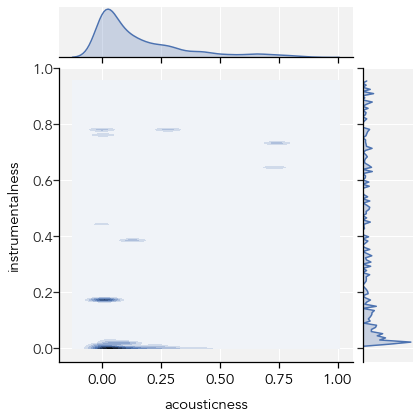

sad


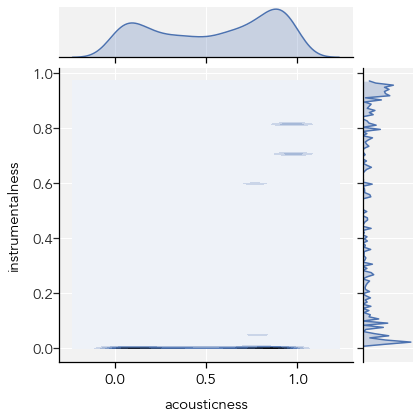

energetic


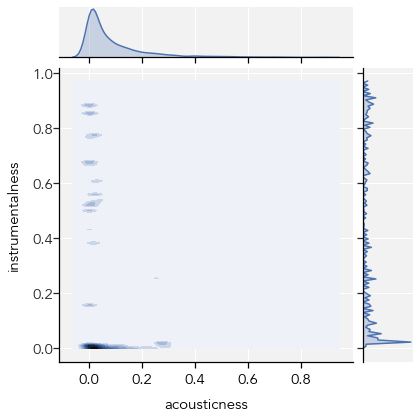

calm


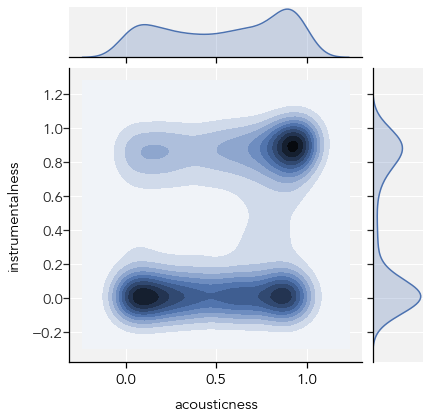

In [58]:
moods = ['happy','sad','energetic','calm']
for mood in moods:
    print(mood)
    g = sns.jointplot("acousticness", "instrumentalness", data=songList[songList['p_mood']==mood], kind='kde');
    plt.show(g)

In [59]:
songList[['acousticness','danceability','duration_ms','energy','instrumentalness','key','liveness','loudness','mode','speechiness','tempo','time_signature','valence']]

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,0.00496,0.733,236093.0,0.899,0.000047,0.0,0.3720,-4.237,1.0,0.1430,127.086,4.0,0.760
1,0.01080,0.657,212107.0,0.695,0.000000,2.0,0.0822,-4.493,1.0,0.0321,65.997,4.0,0.683
2,0.03030,0.796,319373.0,0.867,0.000003,10.0,0.1340,-9.543,1.0,0.0309,120.682,4.0,0.971
3,0.18400,0.731,236920.0,0.738,0.000000,9.0,0.2140,-8.125,0.0,0.0377,117.656,4.0,0.958
4,0.33100,0.942,296147.0,0.641,0.179000,7.0,0.0280,-10.150,1.0,0.0333,114.443,4.0,0.966
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6249,0.20800,0.771,219664.0,0.761,0.000000,1.0,0.0910,-4.727,0.0,0.0470,131.010,4.0,0.277
6250,0.85300,0.794,342040.0,0.320,0.134000,1.0,0.1120,-12.920,0.0,0.1730,174.088,4.0,0.241
6251,0.01210,0.675,155693.0,0.574,0.000011,6.0,0.1080,-8.066,1.0,0.0559,135.037,4.0,0.482
6252,0.02630,0.675,185886.0,0.630,0.000000,4.0,0.2840,-8.052,1.0,0.0720,77.492,4.0,0.223


# Random Forest Classifier

In [60]:
X = songList[['acousticness','danceability','duration_ms','energy','instrumentalness','key','liveness','loudness','mode','speechiness','tempo','time_signature','valence']].to_numpy()
y = songList['p_mood'].to_numpy()

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_test)
print(gnb.score(X_test,y_test))
print(gnb.score(X_train,y_train))

print("Number of mislabeled points out of a total %d points : %d" % (X_test.shape[0], (y_test != y_pred).sum()))

0.4789557805007991
0.4843500114233493
Number of mislabeled points out of a total 1877 points : 978


In [62]:
clf = tree.DecisionTreeClassifier(random_state=1, max_depth=10)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(clf.score(X_test,y_test))
print(clf.score(X_train,y_train))

print("Number of mislabeled points out of a total %d points : %d" % (X_test.shape[0], (y_test != y_pred).sum()))

0.5919019712306872
0.8062599954306603
Number of mislabeled points out of a total 1877 points : 766


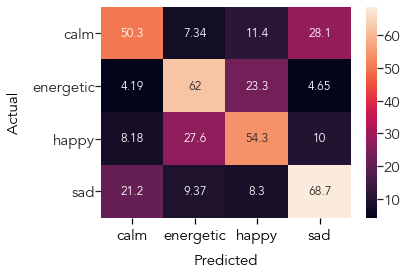

In [63]:
data = {'y_Actual':    y_test,
        'y_Predicted': y_pred
        }
df = pd.DataFrame(data, columns=['y_Actual','y_Predicted'])
confusion_matrix = pd.crosstab(df['y_Actual'], df['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
confusion_matrix = confusion_matrix / confusion_matrix.sum(axis=1)*100
sns.heatmap(confusion_matrix, annot=True,fmt='.3g')
plt.tight_layout()
plt.savefig("dataset13DecisionTreeConfusionMatrix.png")
plt.show()

In [64]:
def getscore(num_steps, data,y_var):
    X = data.to_numpy()
    y = y_var.to_numpy()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
    clf = tree.DecisionTreeClassifier(max_depth=num_steps).fit(X_train,y_train)
    
    
    
    dataTraining = {'y_Actual':    y_test,
                    'y_Predicted': clf.predict(X_test)
                   }
    dfTraining = pd.DataFrame(dataTraining, columns=['y_Actual','y_Predicted'])
    confusionMatrixTraining = pd.crosstab(dfTraining['y_Actual'], dfTraining['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
    
    confusionMatrixTraining = confusionMatrixTraining.div(confusionMatrixTraining.sum(axis=1), axis=0)*100
    sns.heatmap(confusionMatrixTraining, annot=True,fmt='.3g')
    plt.show()
    
    
    return [num_steps, clf.score(X_test,y_test), clf.score(X_train,y_train)]

/Users/admin/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/admin/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1048: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


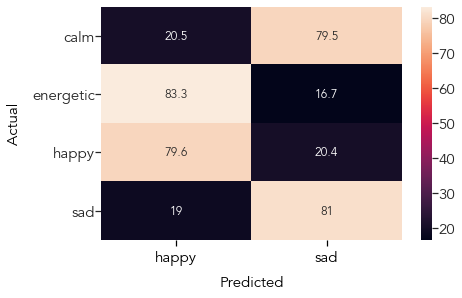

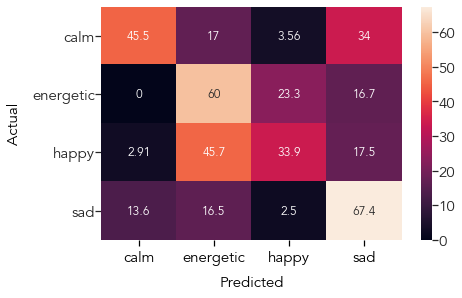

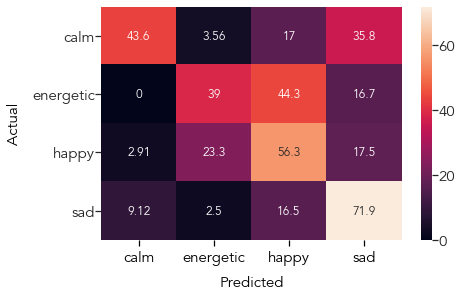

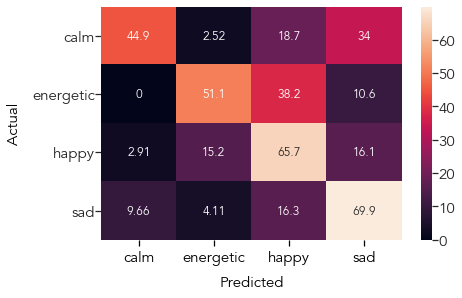

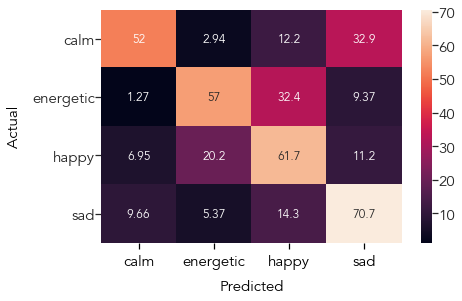

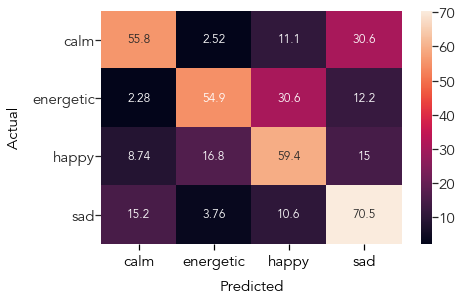

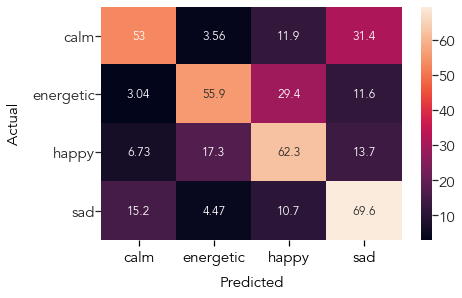

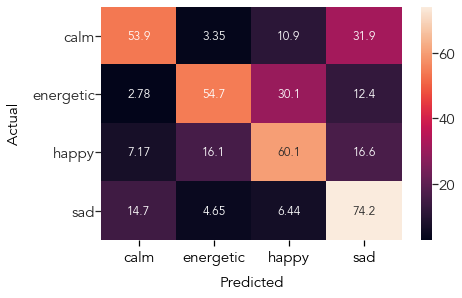

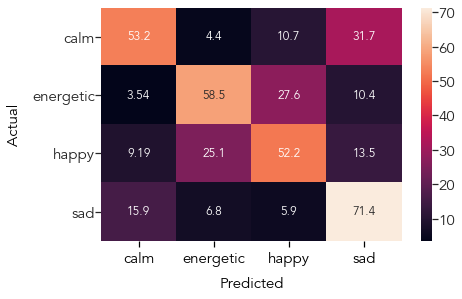

,danceability,energy,liveness,loudness,tempo,time_signature,valence,acousticness_instrumentalness
0,0.733,0.899,0.3720,-4.237,127.086,4.0,0.760,2.341120e-07
1,0.657,0.695,0.0822,-4.493,65.997,4.0,0.683,0.000000e+00
2,0.796,0.867,0.1340,-9.543,120.682,4.0,0.971,8.544600e-08
3,0.731,0.738,0.2140,-8.125,117.656,4.0,0.958,0.000000e+00
4,0.942,0.641,0.0280,-10.150,114.443,4.0,0.966,5.924900e-02
...,...,...,...,...,...,...,...,...
6249,0.771,0.761,0.0910,-4.727,131.010,4.0,0.277,0.000000e+00
6250,0.794,0.320,0.1120,-12.920,174.088,4.0,0.241,1.143020e-01
6251,0.675,0.574,0.1080,-8.066,135.037,4.0,0.482,1.343100e-07
6252,0.675,0.630,0.2840,-8.052,77.492,4.0,0.223,0.000000e+00


In [65]:
scoreData = pd.DataFrame(columns=['num_steps','test_score','train_score'])
variables = ['acousticness','danceability','duration_ms','energy','instrumentalness','key','liveness','loudness','mode','speechiness','tempo','time_signature','valence']
data = songList[['danceability','energy','liveness','loudness','tempo','time_signature','valence']]
y_var = songList['p_mood']
data.loc[:,'acousticness_instrumentalness'] = songList.loc[:,'acousticness']*songList.loc[:,'instrumentalness']
for x in range(1,10):
    scoreData.loc[len(scoreData)] = getscore(x,data, y_var)
data

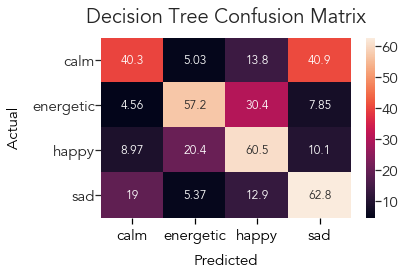

In [95]:
X = songList[['danceability','energy','liveness','loudness','tempo','time_signature','valence']].to_numpy()
y =  songList['p_mood'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
clf = tree.DecisionTreeClassifier(max_depth=5).fit(X_train,y_train)

dataTraining = {'y_Actual':    y_test,
                'y_Predicted': clf.predict(X_test)
               }
dfTraining = pd.DataFrame(dataTraining, columns=['y_Actual','y_Predicted'])
confusionMatrixTraining = pd.crosstab(dfTraining['y_Actual'], dfTraining['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

confusionMatrixTraining = confusionMatrixTraining.div(confusionMatrixTraining.sum(axis=1), axis=0)*100
sns.heatmap(confusionMatrixTraining, annot=True,fmt='.3g')
plt.title("Decision Tree Confusion Matrix")
plt.tight_layout()
plt.savefig('5dataset13DecisionTreeConfusionMatrix.png')
plt.show()

num_steps      4.000000
test_score     0.586042
train_score    0.606123
Name: 3, dtype: float64


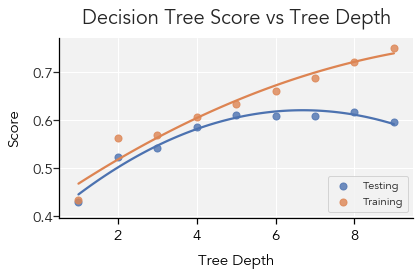

,num_steps,test_score,train_score
0,1.0,0.430474,0.433173
1,2.0,0.523175,0.562257
2,3.0,0.540757,0.569111
3,4.0,0.586042,0.606123
4,5.0,0.608950,0.632397
5,6.0,0.608418,0.660041
6,7.0,0.607885,0.687686
7,8.0,0.615876,0.718986
8,9.0,0.595099,0.749600


In [100]:
print(scoreData.iloc[3,:])

g = sns.regplot(x='num_steps',y='test_score',data=scoreData, scatter_kws={"s": 50}, order=2, ci=None, label="Testing")
g = sns.regplot(x='num_steps',y='train_score',data=scoreData, scatter_kws={"s": 50}, order=2, ci=None, label="Training")
g.set_title("Decision Tree Score vs Tree Depth")
g.set_ylabel("Score")
g.set_xlabel("Tree Depth")
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig('5dataset13DecisionTreeOverfitting.png')
plt.show()

scoreData

# SGD Classifier

In [102]:
X = songList[['acousticness','danceability','duration_ms','energy','instrumentalness','key','liveness','loudness','mode','speechiness','time_signature','valence']].to_numpy()
y = songList['p_mood'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
scaler = StandardScaler()

scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
clf = linear_model.SGDClassifier()
param_grid = [
    {'alpha':[0.001,0.002,0.003],
     'max_iter':[100,150,200,250,300,350],
     'shuffle':[True,False],
     'loss':['hinge', 'log']}
]

grid_search = GridSearchCV(clf, param_grid, cv = 5)
grid_search.fit(X_train, y_train)
print("Best Score is", grid_search.best_estimator_.score)

clf = linear_model.SGDClassifier(alpha=0.001, max_iter=166, tol=1e-3,shuffle=True)
clf.fit(X_train, y_train)

Best Score is <bound method ClassifierMixin.score of SGDClassifier(alpha=0.002, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='log', max_iter=250,
              n_iter_no_change=5, n_jobs=None, penalty='l2', power_t=0.5,
              random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)>


SGDClassifier(alpha=0.001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=166, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [103]:
grid_search.best_score_
print(y_test)

['energetic' 'calm' 'calm' ... 'sad' 'sad' 'happy']


Training Data
Score 0.6366180291824906


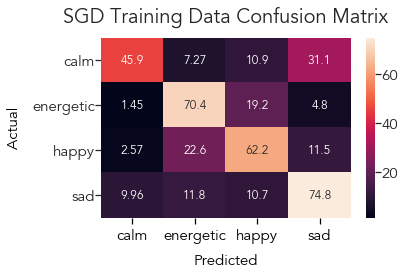

In [104]:
print("Training Data")
print("Score",grid_search.best_estimator_.score(X_train,y_train))

dataTraining = {'y_Actual':    y_train,
        'y_Predicted': grid_search.best_estimator_.predict(X_train)
        }
dfTraining = pd.DataFrame(dataTraining, columns=['y_Actual','y_Predicted'])
confusionMatrixTraining = pd.crosstab(dfTraining['y_Actual'], dfTraining['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

confusionMatrixTraining = confusionMatrixTraining / confusionMatrixTraining.sum(axis=1)*100
sns.heatmap(confusionMatrixTraining, annot=True,fmt='.3g')
plt.title("SGD Training Data Confusion Matrix")
plt.tight_layout()
plt.savefig('5dataset13SGDConfusionMatrix1.png')
plt.show()

Testing Data
Score 0.6155075939248601


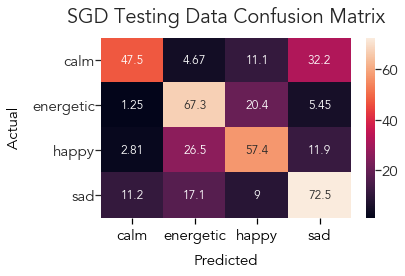

In [105]:
print("Testing Data")
print("Score",grid_search.best_estimator_.score(X_test,y_test))
dataTesting = {'y_Actual':    y_test,
        'y_Predicted': grid_search.best_estimator_.predict(X_test)
        }
dfTesting = pd.DataFrame(dataTesting, columns=['y_Actual','y_Predicted'])
confusionMatrixTesting = pd.crosstab(dfTesting['y_Actual'], dfTesting['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

confusionMatrixTesting = confusionMatrixTesting / confusionMatrixTesting.sum(axis=1)*100

sns.heatmap(confusionMatrixTesting, annot=True,fmt='.3g')
plt.title("SGD Testing Data Confusion Matrix")
plt.tight_layout()
plt.savefig('5dataset13SGDConfusionMatrix2.png')
plt.show()

# Tuning SGD Model

### test

In [114]:
def trainAndScore(dataX, dataY):
    ## set up arrays
    X = dataX.to_numpy()
    y = dataY.to_numpy()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    ## regularizaiton
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    
    ## creaing model
    clf = linear_model.SGDClassifier()
    param_grid = [
        {'alpha':[0.001,0.002,0.003],
         'max_iter':[100,150,200,250,300,350],
         'shuffle':[True,False],
         'loss':['hinge', 'log']}
    ]

    grid_search = GridSearchCV(clf, param_grid, cv = 5)
    grid_search.fit(X_train, y_train)

    ## coefficients heatmap
    coefficientsEstimator = grid_search.best_estimator_.coef_
    print("Coefficients")
    plt.figure(figsize=(15,5))
    sns.heatmap(coefficientsEstimator,annot=True,xticklabels=dataX.columns, yticklabels=grid_search.best_estimator_.classes_)
    plt.title("SGD Coefficients Heatmap")
    plt.savefig("6dataset13CoefficientsHeatmap.png")
    plt.show()
    
    
    ## training data
    print("Training Data")
    print("Score",grid_search.best_estimator_.score(X_train,y_train))
    
    dataTraining = {'y_Actual':    y_train,
                    'y_Predicted': grid_search.best_estimator_.predict(X_train)
                   }
    dfTraining = pd.DataFrame(dataTraining, columns=['y_Actual','y_Predicted'])
    confusionMatrixTraining = pd.crosstab(dfTraining['y_Actual'], dfTraining['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
    
    confusionMatrixTraining = confusionMatrixTraining.div(confusionMatrixTraining.sum(axis=1), axis=0)*100
    sns.heatmap(confusionMatrixTraining, annot=True,fmt='.3g')
    plt.title("SGD Training Confusion Matrix")
    plt.tight_layout()
    plt.savefig("6dataset13ConfusionMatrix1.png")
    plt.show()
    
    ## testing data
    print("Testing Data")
    print("Score",grid_search.best_estimator_.score(X_test,y_test))
    dataTesting = {'y_Actual':    y_test,
                   'y_Predicted': grid_search.best_estimator_.predict(X_test)
                  }
    dfTesting = pd.DataFrame(dataTesting, columns=['y_Actual','y_Predicted'])
    confusionMatrixTesting = pd.crosstab(dfTesting['y_Actual'], dfTesting['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])

    confusionMatrixTesting = confusionMatrixTesting.div(confusionMatrixTesting.sum(axis=1), axis=0)*100

    sns.heatmap(confusionMatrixTesting, annot=True,fmt='.3g')
    plt.title("SGD Testing Confusion Matrix")
    plt.tight_layout()
    plt.savefig("6dataset13ConfusionMatrix2.png")
    plt.show()
    
    return grid_search.best_estimator_, scaler

## Original, All Columns

Coefficients


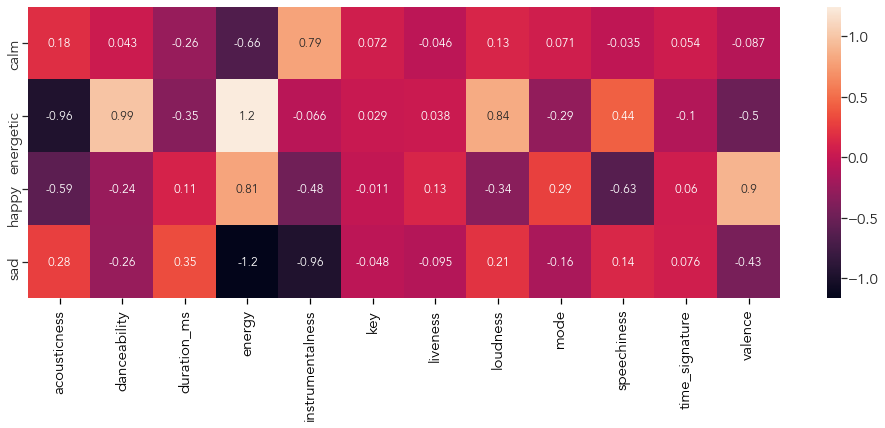

Training Data
Score 0.6340195882470517


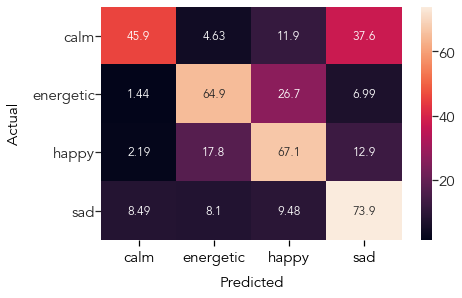

Testing Data
Score 0.6298960831334932


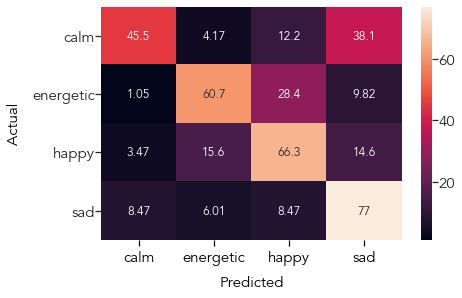

In [73]:
dataX = songList[['acousticness','danceability','duration_ms','energy','instrumentalness','key','liveness','loudness','mode','speechiness','time_signature','valence']]
dataY = songList['p_mood']
clf, scaler = trainAndScore(dataX,dataY)

/Users/admin/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/admin/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1048: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


Coefficients


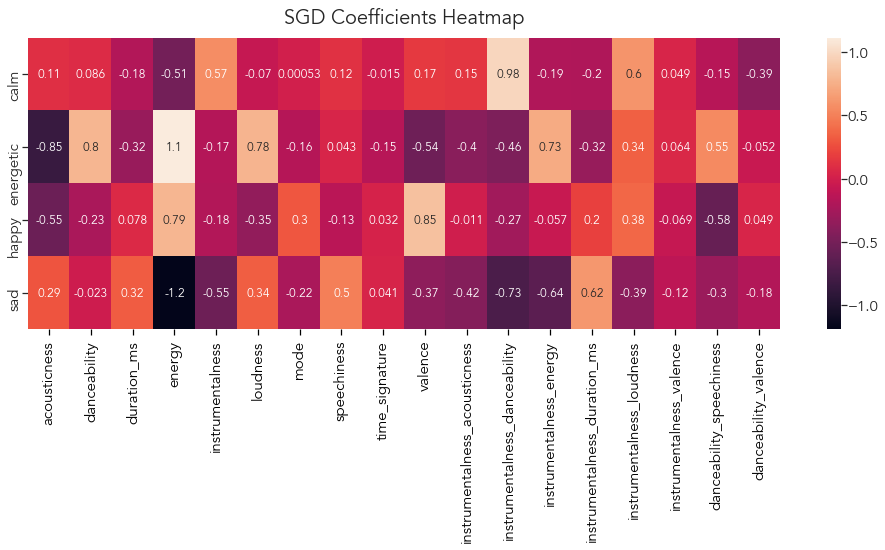

Training Data
Score 0.6412152708374975


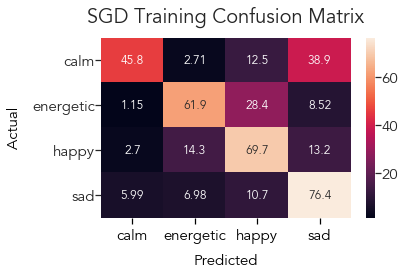

Testing Data
Score 0.6322941646682654


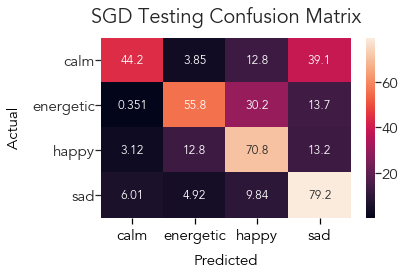

In [115]:
dataX1 = songList[['acousticness','danceability','duration_ms','energy','instrumentalness','loudness','mode','speechiness','time_signature','valence']]
#dataX1.loc[:,'scaled_instrumentalness'] = dataX1.loc[:,'instrumentalness']*100

# calm and sad splits
dataX1.loc[:,'instrumentalness_acousticness'] = dataX1.loc[:,'instrumentalness']*dataX1.loc[:,'acousticness']
dataX1.loc[:,'instrumentalness_danceability'] = dataX1.loc[:,'instrumentalness']*dataX1.loc[:,'danceability']
dataX1.loc[:,'instrumentalness_energy'] = dataX1.loc[:,'instrumentalness']*dataX1.loc[:,'energy']
dataX1.loc[:,'instrumentalness_duration_ms'] = dataX1.loc[:,'instrumentalness']*dataX1.loc[:,'duration_ms']
dataX1.loc[:,'instrumentalness_loudness'] = dataX1.loc[:,'instrumentalness']*dataX1.loc[:,'loudness']
dataX1.loc[:,'instrumentalness_valence'] = dataX1.loc[:,'instrumentalness']*dataX1.loc[:,'valence']





# energetic and happy splits
dataX1.loc[:,'danceability_speechiness'] = dataX1.loc[:,'danceability']*dataX1.loc[:,'speechiness']
dataX1.loc[:,'danceability_valence'] = dataX1.loc[:,'danceability']*dataX1.loc[:,'valence']

dataY1 = songList['p_mood']
clf1, scaler1 = trainAndScore(dataX1,dataY1)

In [75]:
dataX1copy = dataX1.to_numpy()
dataX1copy = scaler1.transform(dataX1copy)
dataY1pred = clf1.predict(dataX1copy)
differences1 = dataY1pred == dataY1.to_numpy()
songListDifferences = songList.copy()
songListDifferences['prediction'] = dataY1pred
songListDifferences['differences'] = differences1

True Positives/False Negatives


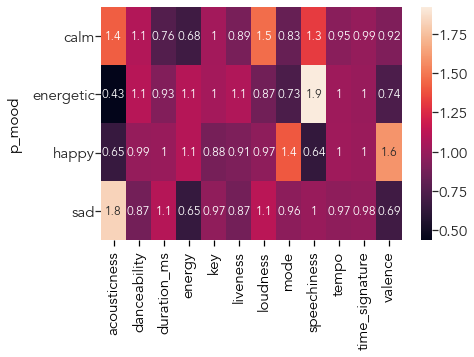

True Positives/ False Positives


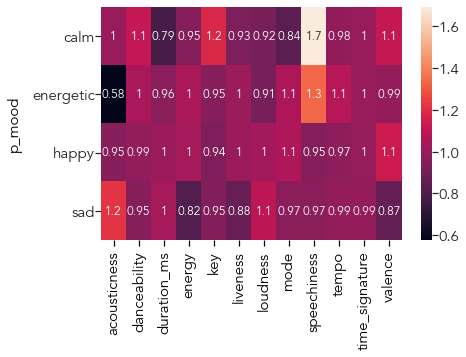

In [76]:
TruePositives = songListDifferences[songListDifferences['differences']].groupby('p_mood').mean()
FalseNegatives = songListDifferences[songListDifferences['differences'] == False].groupby('p_mood').mean()
FalsePositives = songListDifferences[songListDifferences['differences'] == False].groupby('prediction').mean()

floatColumns = list(TruePositives.columns)
floatColumns.remove('differences')
floatColumns.remove('instrumentalness')

TruePositives = TruePositives[floatColumns]
FalseNegatives = FalseNegatives[floatColumns]
FalsePositives = FalsePositives[floatColumns]

print("True Positives/False Negatives")
sns.heatmap(TruePositives/FalseNegatives,annot=True)
plt.show()
print("True Positives/ False Positives")
sns.heatmap(TruePositives/FalsePositives,annot=True)
plt.show()

In [77]:
newSongList = pd.read_csv('songlist31.csv',index_col = 0)
newSongListFeatures = pd.read_csv('songlistFeatures31.csv',index_col = 0)
finalSongList = pd.merge(newSongListFeatures, newSongList, how='inner',left_on=['song_id','p_name'],right_on=['id','p_name'])
finalSongList.loc[0,:]

song_id                   1uXbwHHfgsXcUKfSZw5ZJ0
p_mood_x                               energetic
p_creator_x                              Spotify
p_name                Working Out Together: HAIM
pitch_mean                              0.483187
pitch_variance                         0.0926163
timbre_mean                              10.7709
timbre_variance                        0.0926163
intensity_mean                          -23.4989
intensity_variance                       60.4782
rhythm_mean                             0.236238
rhythm_variance                         3.39e-06
acousticness                             0.00496
danceability                               0.733
duration_ms                               236093
energy                                     0.899
id                        1uXbwHHfgsXcUKfSZw5ZJ0
instrumentalness                        4.72e-05
key                                            0
liveness                                   0.372
loudness            

/Users/admin/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/Users/admin/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Coefficients


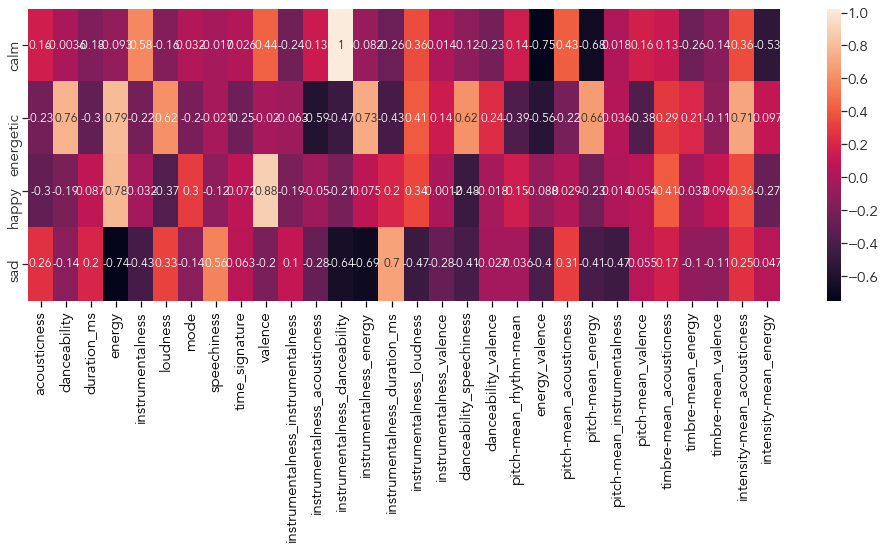

Training Data
Score 0.6476705490848585


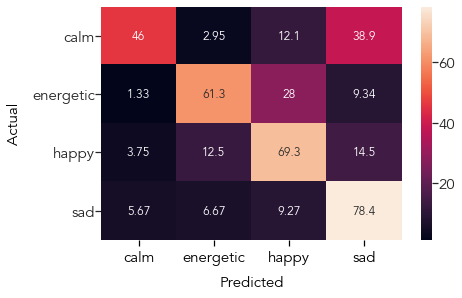

Testing Data
Score 0.6458852867830424


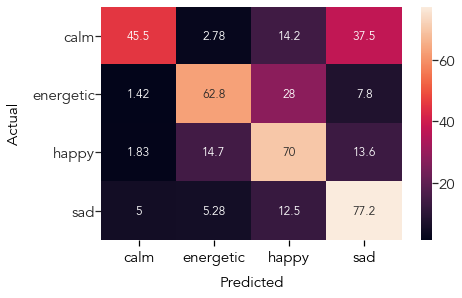

In [78]:
dataX2 = finalSongList[['pitch_mean','pitch_variance','timbre_mean','timbre_variance','intensity_mean','intensity_variance','rhythm_mean','rhythm_variance','acousticness','danceability','duration_ms','energy','instrumentalness','loudness','mode','speechiness','time_signature','valence']]
#dataX1.loc[:,'scaled_instrumentalness'] = dataX1.loc[:,'instrumentalness']*100

# calm and sad splits
dataX2.loc[:,'instrumentalness_instrumentalness'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'instrumentalness']
dataX2.loc[:,'instrumentalness_acousticness'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'acousticness']
dataX2.loc[:,'instrumentalness_danceability'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'danceability']
dataX2.loc[:,'instrumentalness_energy'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'energy']
dataX2.loc[:,'instrumentalness_duration_ms'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'duration_ms']
dataX2.loc[:,'instrumentalness_loudness'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'loudness']
dataX2.loc[:,'instrumentalness_valence'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'valence']





# energetic and happy splits
dataX2.loc[:,'danceability_speechiness'] = dataX2.loc[:,'danceability']*dataX2.loc[:,'speechiness']
dataX2.loc[:,'danceability_valence'] = dataX2.loc[:,'danceability']*dataX2.loc[:,'valence']
dataX2.loc[:,'pitch-mean_rhythm-mean'] = dataX2.loc[:,'rhythm_mean']*dataX2.loc[:,'pitch_mean']


# calm happy splits
dataX2.loc[:,'energy_valence'] = dataX2.loc[:,'energy']*dataX2.loc[:,'valence']
dataX2.loc[:,'pitch-mean_acousticness'] = dataX2.loc[:,'pitch_mean']*dataX2.loc[:,'acousticness']

# happy sad splits
dataX2.loc[:,'pitch-mean_energy'] = dataX2.loc[:,'energy']*dataX2.loc[:,'pitch_mean']



dataX2.loc[:,'pitch-mean_instrumentalness'] = dataX2.loc[:,'instrumentalness']*dataX2.loc[:,'pitch_mean']
dataX2.loc[:,'pitch-mean_valence'] = dataX2.loc[:,'valence']*dataX2.loc[:,'pitch_mean']
dataX2.loc[:,'timbre-mean_acousticness'] = dataX2.loc[:,'timbre_mean']*dataX2.loc[:,'acousticness']
dataX2.loc[:,'timbre-mean_energy'] = dataX2.loc[:,'timbre_mean']*dataX2.loc[:,'energy']
dataX2.loc[:,'timbre-mean_valence'] = dataX2.loc[:,'timbre_mean']*dataX2.loc[:,'valence']
dataX2.loc[:,'intensity-mean_acousticness'] = dataX2.loc[:,'intensity_mean']*dataX2.loc[:,'acousticness']
dataX2.loc[:,'intensity-mean_energy'] = dataX2.loc[:,'intensity_mean']*dataX2.loc[:,'energy']









dataX2 = dataX2.drop(['pitch_mean','pitch_variance','timbre_mean','timbre_variance','intensity_mean','intensity_variance','rhythm_mean','rhythm_variance'], axis=1)

dataY2 = finalSongList['p_mood_x']
clf2, scaler2 = trainAndScore(dataX2,dataY2)

Index(['song_id', 'p_mood_x', 'p_creator_x', 'p_name', 'pitch_mean',
       'pitch_variance', 'timbre_mean', 'timbre_variance', 'intensity_mean',
       'intensity_variance', 'rhythm_mean', 'rhythm_variance', 'acousticness',
       'danceability', 'duration_ms', 'energy', 'id', 'instrumentalness',
       'key', 'liveness', 'loudness', 'mode', 'p_creator_y', 'p_mood_y',
       'speechiness', 'tempo', 'time_signature', 'valence'],
      dtype='object')
0        True
1        True
2        True
3        True
4        True
        ...  
6006    False
6007    False
6008    False
6009    False
6010    False
Name: p_mood_x, Length: 6011, dtype: bool


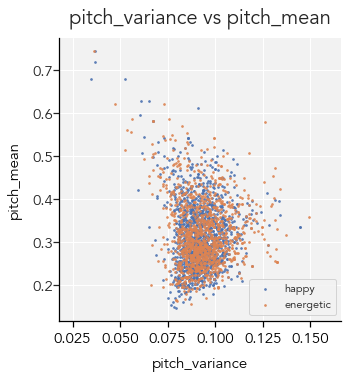

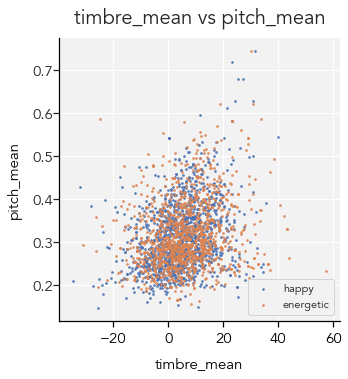

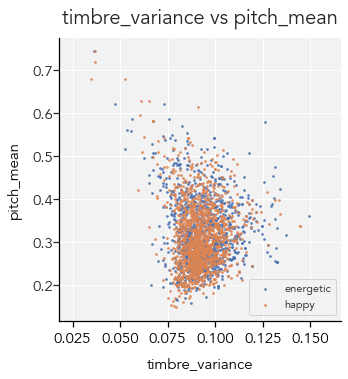

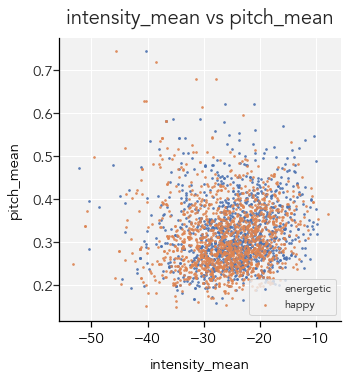

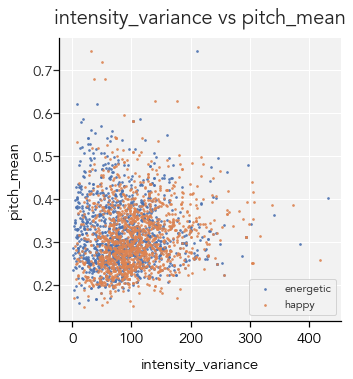

...

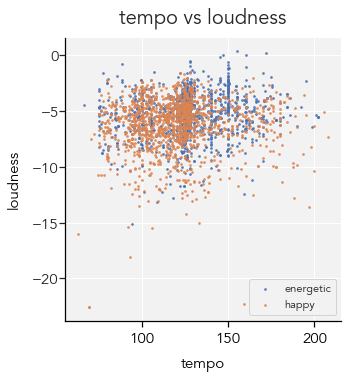

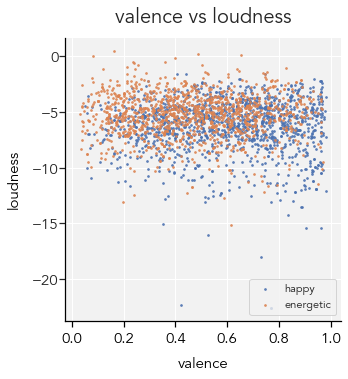

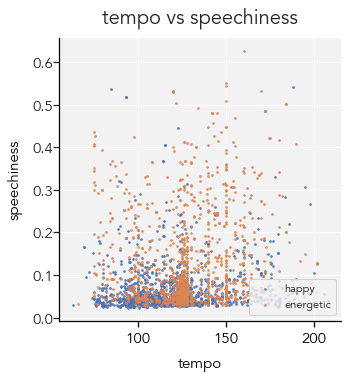

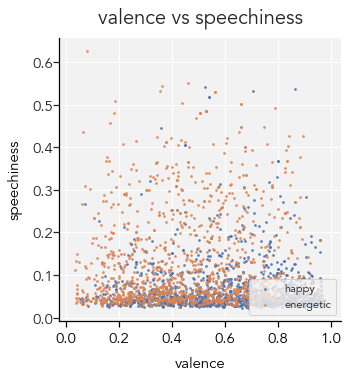

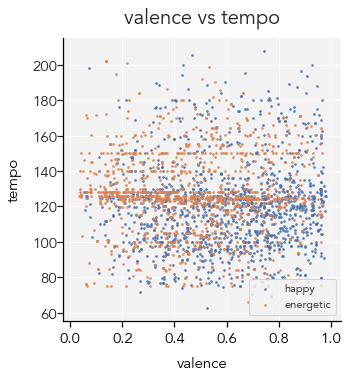

In [111]:
a = finalSongList.dtypes == 'float64'
print(a.index)
desiredMoods = ['happy','energetic']
correctMood = finalSongList.p_mood_x.isin(desiredMoods)
print(correctMood)
for y in range(len(a)):
    for x in range(y+1,len(a)):
        if(a[x] and a[y]):
            try:
                sns.lmplot( x=a.index[x], y=a.index[y], data=finalSongList[correctMood].sample(frac=1), fit_reg=False, hue='p_mood_x', legend=False, scatter_kws={"s": 3})
                plt.legend(loc='lower right')
                plt.title(a.index[x]+" vs " +a.index[y])
                plt.show(g)
            except:
                print("didnt work")



In [80]:
# save the model
dump(clf2, open('model.pkl', 'wb'))
# save the scaler
dump(scaler2, open('scaler.pkl', 'wb'))

In [81]:
print(scaler2)

StandardScaler(copy=True, with_mean=True, with_std=True)


In [82]:
# save the model
dump(clf1, open('model1.pkl', 'wb'))
# save the scaler
dump(scaler1, open('scaler1.pkl', 'wb'))